In [1]:
!pip install ultralytics torch opencv-python scikit-learn pyyaml xgboost

In [2]:
import torch
print("GPU Available:", torch.cuda.is_available())
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


GPU Available: True
GPU Name: NVIDIA GeForce RTX 3060 Laptop GPU


In [3]:
import os
import yaml
import torch
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
import numpy as np
import cv2
import shutil

In [4]:
import os

def load_data(root_dir):
    data = []
    labels = []
    for subject in os.listdir(root_dir):
        subject_path = os.path.join(root_dir, subject)
        if os.path.isdir(subject_path):
            for activity_type in os.listdir(subject_path):
                activity_path = os.path.join(subject_path, activity_type)
                if os.path.isdir(activity_path):
                    label = 1 if activity_type == 'fall' else 0
                    for activity_class in os.listdir(activity_path):
                        class_path = os.path.join(activity_path, activity_class)
                        if os.path.isdir(class_path):
                            for file in os.listdir(class_path):
                                file_path = os.path.join(class_path, file)
                                if os.path.isfile(file_path):
                                    data.append(file_path)
                                    labels.append(label)
    return data, labels


In [5]:
import os
import shutil

def clear_output_directory(output_dir):
    if os.path.exists(output_dir):
        for filename in os.listdir(output_dir):
            file_path = os.path.join(output_dir, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)
            except Exception as e:
                print(f"Failed to delete {file_path}: {e}")
    else:
        os.makedirs(output_dir)

output_dir = "output"
clear_output_directory(output_dir)
print("Output directory cleared.")


Output directory cleared.


In [6]:
def normalize_and_save_images(input_dir, output_dir, image_size=(640, 640)):
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                input_path = os.path.join(root, file)

                relative_path = os.path.relpath(root, input_dir)
                output_path_dir = os.path.join(output_dir, relative_path)
                os.makedirs(output_path_dir, exist_ok=True)
                output_path = os.path.join(output_path_dir, file)

                image = cv2.imread(input_path)
                if image is None:
                    print(f"Warning: Unable to load {input_path}. Skipping...")
                    continue

                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image_resized = cv2.resize(image_rgb, image_size)
                image_normalized = image_resized / 255.0
                image_normalized_uint8 = (image_normalized * 255).astype(np.uint8)

                cv2.imwrite(output_path, cv2.cvtColor(image_normalized_uint8, cv2.COLOR_RGB2BGR))

    print(f"Normalized images saved to: {output_dir}")

In [7]:
import albumentations as A
import cv2

def augment_and_save_from_root(root_dir, output_dir, augment_ratio=2, save_original=True):
    clear_output_directory(output_dir)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Define augmentation pipeline
    augmentation = A.Compose([
        # A.RandomRotate90(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.7),
        # A.OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=0.3),
        # A.RandomResizedCrop(height=640, width=640, scale=(0.8, 1.0), p=0.5),
        # A.GaussianBlur(blur_limit=3, p=0.2),
        # A.CLAHE(p=0.2),
        # A.ToGray(p=0.2),  # Convert some images to grayscale for variety
    ])

    augmented_data = []
    augmented_labels = []
    errors = []

    for subject in os.listdir(root_dir):
        subject_path = os.path.join(root_dir, subject)
        if os.path.isdir(subject_path):
            for activity_type in os.listdir(subject_path):
                label = 1 if activity_type == 'fall' else 0
                activity_path = os.path.join(subject_path, activity_type)
                for activity_class in os.listdir(activity_path):
                    class_path = os.path.join(activity_path, activity_class)
                    for file in os.listdir(class_path):
                        img_path = os.path.join(class_path, file)
                        image = cv2.imread(img_path)
                        if image is None:
                            errors.append(img_path)
                            continue

                        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                        output_class_dir = os.path.join(output_dir, subject, activity_type, activity_class)
                        os.makedirs(output_class_dir, exist_ok=True)

                        if save_original:
                            save_path = os.path.join(output_class_dir, f"{file.split('.')[0]}_original.jpg")
                            cv2.imwrite(save_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
                            augmented_data.append(save_path)
                            augmented_labels.append(label)

                        for i in range(augment_ratio):
                            augmented = augmentation(image=image)
                            augmented_image = augmented["image"]

                            aug_save_path = os.path.join(output_class_dir, f"{file.split('.')[0]}_aug{i}.jpg")
                            cv2.imwrite(aug_save_path, cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR))
                            augmented_data.append(aug_save_path)
                            augmented_labels.append(label)

    if errors:
        print("\n--- Errors During Augmentation ---")
        for err in errors:
            print(f"Could not process image: {err}")

    print(f"\nSaved {len(augmented_data)} images to {output_dir}")
    return augmented_data, augmented_labels

C:\Users\Sevilz\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Sevilz\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.23 (you have 1.4.22). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [8]:
import cv2
import numpy as np
def apply_histogram_equalization(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray)
    
    cv2.imwrite(image_path, equalized)
    
    return image_path

In [9]:
# for root, dirs, files in os.walk(root_dir):
#     for filename in files:
#         image_path = os.path.join(root, filename)
        
#         # Check if the file is an image
#         if filename.lower().endswith(('.jpg', '.png', '.jpeg')):
#             equalized_image_path = apply_histogram_equalization(image_path)
#             print(f"Equalized image saved at: {equalized_image_path}")

# print("All images in the 'train' directory and subdirectories have been equalized and replaced.")

In [10]:
root_dir = 'train'
train_data, train_labels = load_data(root_dir)

# train_data, train_labels = augment_and_save_from_root(root_dir,output_dir, augment_ratio=1)
print(f"Total images loaded: {len(train_data)}")

Total images loaded: 4294


In [11]:
import csv
import os
import shutil
from ultralytics import YOLO
import tensorflow as tf

yolo_input_dir = "yolo_input"
os.makedirs(yolo_input_dir, exist_ok=True)
clear_output_directory(yolo_input_dir)

for img_path in train_data:
    if os.path.exists(img_path) and os.path.isfile(img_path):
        unique_filename = "_".join(img_path.split(os.sep)[-3:])
        unique_filepath = os.path.join(yolo_input_dir, unique_filename)
        shutil.copy(img_path, unique_filepath)
    else:
        print(f"File not found or inaccessible: {img_path}")

copied_files = os.listdir(yolo_input_dir)
print(f"Total files copied to YOLO input directory: {len(copied_files)}")

model = YOLO('yolov8n-pose.pt')
    
results = model.predict(
    source=yolo_input_dir,
    task="pose",
    imgsz=640,
    verbose=False,
    save=False
)
    
print(f"Predictions saved in: {results[0].save_dir}")

Total files copied to YOLO input directory: 4294

WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Predictions saved in: None


In [12]:
import csv
import os
import numpy as np

output_csv = "yolo_keypoints.csv"
with open(output_csv, mode='w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    header = ['image_name']
    for i in range(1, 18):
        header.extend([f'keypoint_{i}_x', f'keypoint_{i}_y'])
    writer.writerow(header)

    for result in results:
        image_name = os.path.basename(result.path)
    
        if hasattr(result, 'keypoints') and result.keypoints is not None and len(result.keypoints) > 0:
            keypoints = result.keypoints[0].cpu().numpy()
            
            keypoints_xy = result.keypoints.xy[0].cpu().numpy()
    
            if keypoints_xy.shape == (17, 2):
                keypoint_data = [image_name]
                
                for kp in keypoints_xy:
                    keypoint_data.extend([kp[0], kp[1]])
    
                writer.writerow(keypoint_data)
            else:
                print(f"Unexpected keypoint shape for image {image_name}: {keypoints_xy.shape}")
        else:
            print(f"No keypoints detected for image: {image_name}")
    print(f"Keypoint data saved to: {output_csv}")


Unexpected keypoint shape for image fall_2_forward_falls_frame018.jpg: (0, 2)
Unexpected keypoint shape for image fall_2_right_falls_frame021.jpg: (0, 2)
Unexpected keypoint shape for image fall_2_right_falls_frame022.jpg: (0, 2)
Unexpected keypoint shape for image fall_3_standing_falls_frame012.jpg: (0, 2)
Unexpected keypoint shape for image fall_4_left_falls_frame042.jpg: (0, 2)
Unexpected keypoint shape for image fall_4_left_falls_frame043.jpg: (0, 2)
Unexpected keypoint shape for image fall_4_left_falls_frame044.jpg: (0, 2)
Unexpected keypoint shape for image fall_4_left_falls_frame045.jpg: (0, 2)
Keypoint data saved to: yolo_keypoints.csv


In [13]:
import pandas as pd

data = pd.read_csv("yolo_keypoints.csv")

def label_image(image_name):
    image_name = image_name.lower()
    if "non_fall" in image_name:
        return 0
    elif "fall" in image_name:
        return 1
    else:
        return None 

data['label'] = data['image_name'].apply(label_image)

data = data.dropna(subset=['label'])

output_csv = "yolo_keypoints_labeled.csv"
data.to_csv(output_csv, index=False)

print(f"Labeled data saved to: {output_csv}")


Labeled data saved to: yolo_keypoints_labeled.csv


In [14]:
import pandas as pd
import numpy as np

def interpolate_single_zero_keypoints(data):
    keypoint_columns = [col for col in data.columns if 'keypoint' in col]
    
    for col in keypoint_columns:
        values = data[col].values
        
        for idx in range(1, len(values) - 1):
            if values[idx] == 0:
                if values[idx - 1] != 0 and values[idx + 1] != 0:
                    values[idx] = (values[idx - 1] + values[idx + 1]) / 2
        
        data[col] = values

    return data

input_csv = "yolo_keypoints_labeled.csv"
data = pd.read_csv(input_csv)

data_interpolated = interpolate_single_zero_keypoints(data)
output_csv_interpolated = "yolo_keypoints_labeled_interpolated.csv"
data_interpolated.to_csv(output_csv_interpolated, index=False)

print(f"Interpolated keypoint data saved to: {output_csv_interpolated}")


Interpolated keypoint data saved to: yolo_keypoints_labeled_interpolated.csv


In [15]:
from sklearn.preprocessing import StandardScaler

def normalize_keypoints(keypoints):
    scaler = StandardScaler()
    return scaler.fit_transform(keypoints)


In [16]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Path to the labeled CSV file
# labeled_csv = "yolo_keypoints_labeled_interpolated.csv" # Replace with your labeled CSV path

# # Load the CSV
# df = pd.read_csv(labeled_csv)

# # Inspect the DataFrame
# print("Labeled Keypoints Data:")
# print(df.head())

# # Number of keypoints
# num_keypoints = 17

# # Separate the keypoints by label
# labels = df['label'].unique()  # Get unique classes/labels

# # Function to extract keypoints as a flattened DataFrame
# def extract_flat_keypoints(df, num_keypoints):
#     x_values = []
#     y_values = []
#     label_values = []
#     for idx, row in df.iterrows():
#         for i in range(1, num_keypoints + 1):
#             x_values.append(row[f'keypoint_{i}_x'])
#             y_values.append(row[f'keypoint_{i}_y'])
#             label_values.append(row['label'])
#     return pd.DataFrame({'x': x_values, 'y': y_values, 'label': label_values})

# # Flatten keypoints for visualization
# keypoints_flat = extract_flat_keypoints(df, num_keypoints)

# # Plot Scatter Plots for Each Label
# plt.figure(figsize=(12, 8))
# sns.scatterplot(data=keypoints_flat, x='x', y='y', hue='label', style='label', palette='deep', alpha=0.5, s=10)
# plt.title("Scatter Plot of Keypoints by Label")
# plt.xlabel("X Coordinate")
# plt.ylabel("Y Coordinate")
# plt.legend(title="Class Label")
# plt.show()

# # KDE Plot for Keypoint Distribution by Label
# plt.figure(figsize=(12, 8))
# sns.kdeplot(data=keypoints_flat, x='x', y='y', hue='label', fill=True, palette='deep', alpha=0.6, cbar=True)
# plt.title("KDE Plot of Keypoints by Label")
# plt.xlabel("X Coordinate")
# plt.ylabel("Y Coordinate")
# plt.show()

# # Histograms for X and Y Coordinates Grouped by Label
# plt.figure(figsize=(14, 7))

# # X Coordinate Histogram
# plt.subplot(1, 2, 1)
# sns.histplot(data=keypoints_flat, x='x', hue='label', kde=True, palette='deep', element='step', stat='density', common_norm=False)
# plt.title("Histogram of X Coordinates by Label")
# plt.xlabel("X Coordinate")

# # Y Coordinate Histogram
# plt.subplot(1, 2, 2)
# sns.histplot(data=keypoints_flat, x='y', hue='label', kde=True, palette='deep', element='step', stat='density', common_norm=False)
# plt.title("Histogram of Y Coordinates by Label")
# plt.xlabel("Y Coordinate")

# plt.tight_layout()
# plt.show()


In [17]:
# # Plot each keypoint separately
# fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(18, 24))  # Adjust rows/columns for 17 keypoints
# axes = axes.flatten()  # Flatten axes for easier indexing

# for i in range(1, 18):  # Loop through 17 keypoints
#     keypoint_data = keypoints_flat[(keypoints_flat.index % 17) == (i - 1)]  # Extract i-th keypoint
    
#     # Scatter plot for the current keypoint
#     sns.scatterplot(data=keypoint_data, x='x', y='y', hue='label', palette='deep', ax=axes[i-1], s=10, alpha=0.5)
#     axes[i-1].set_title(f"Scatter Plot for Keypoint {i}")
#     axes[i-1].set_xlabel("X Coordinate")
#     axes[i-1].set_ylabel("Y Coordinate")
#     axes[i-1].legend(title="Label", loc="upper right")

# plt.tight_layout()
# plt.show()


In [18]:
# import os
# import matplotlib.pyplot as plt
# from PIL import Image

# # Path to your YOLO output directory
# image_dir = "/kaggle/working/runs/pose/predict"

# # Get a list of image files in the directory
# image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

# # Display images in a grid
# num_images = min(len(image_files), 80)  # Display up to 12 images
# num_cols = 4
# num_rows = (num_images + num_cols - 1) // num_cols

# fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))

# # Flatten axes for easier iteration
# axes = axes.flatten()

# for i, ax in enumerate(axes):
#     if i < num_images:
#         img_path = os.path.join(image_dir, image_files[i])
#         img = Image.open(img_path)
#         ax.imshow(img)
#         ax.set_title(os.path.basename(img_path))
#         ax.axis('off')
#     else:
#         # Hide unused axes
#         ax.axis('off')

# plt.tight_layout()
# plt.show()


In [19]:
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score, classification_report
# import xgboost as xgb
# import joblib
# from sklearn.model_selection import GridSearchCV

# # Step 1: Load the labeled data
# data = pd.read_csv("yolo_keypoints_labeled_interpolated.csv")

# # Step 2: Split into features (X) and labels (y)
# # Drop 'image_name' since it's not a feature for training
# X = data.drop(columns=['image_name', 'label'])
# y = data['label']

# # Step 3: Train-test split (80% train, 20% test)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# # Step 4: Train the XGBoost Classifier
# # Step 4: Train the XGBoost Classifier
# model = xgb.XGBClassifier(
#     n_estimators=200,        # Best value from tuning
#     learning_rate=0.05,      # Best learning rate
#     max_depth=7,             # Best depth
#     min_child_weight=3,      # Helps control overfitting
#     gamma=0.1,               # Minimum loss reduction
#     subsample=0.9,           # Row sampling for trees
#     colsample_bytree=0.9,    # Feature sampling for trees
#     reg_alpha=0.1,           # L1 regularization
#     reg_lambda=0.2,          # L2 regularization
#     random_state=42          # Seed for reproducibility
# )


# # Train the model
# model.fit(X_train, y_train)

# # Step 5: Evaluate the Model
# # Make predictions
# y_pred = model.predict(X_test)

# # Calculate accuracy
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# # Print a classification report
# print("Classification Report:")
# print(classification_report(y_test, y_pred))

# # Step 6: Save the Model
# output_model = "xgboost_fall_detection_model.pkl"
# joblib.dump(model, output_model)
# print(f"Model saved to: {output_model}")


In [20]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, RobustScaler

def preprocess_keypoints(file_path, scaler=None):
    keypoints = pd.read_csv(file_path)
    
    keypoints_imputed = keypoints.fillna(keypoints.mean())
    if scaler:
        keypoints_normalized = scaler.transform(keypoints_imputed)
    else:
        scaler = StandardScaler()
        keypoints_normalized = scaler.fit_transform(keypoints_imputed)

    return keypoints_normalized, scaler


def load_data_with_preprocessing(root_dir):
    data = []
    labels = []
    scaler = RobustScaler()

    for subject in os.listdir(root_dir):
        subject_path = os.path.join(root_dir, subject)
        if os.path.isdir(subject_path):
            for activity_type in os.listdir(subject_path):
                activity_path = os.path.join(subject_path, activity_type)
                if os.path.isdir(activity_path):
                    label = 1 if activity_type == 'fall' else 0
                    for activity_class in os.listdir(activity_path):
                        class_path = os.path.join(activity_path, activity_class)
                        if os.path.isdir(class_path):
                            for file in os.listdir(class_path):
                                file_path = os.path.join(class_path, file)
                                if os.path.isfile(file_path):
                                    keypoints, scaler = preprocess_keypoints(file_path, scaler)
                                    data.append(keypoints)
                                    labels.append(label)

    return np.array(data), np.array(labels), scaler


In [252]:
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold, StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
import joblib
from sklearn.model_selection import GridSearchCV

data = pd.read_csv("yolo_keypoints_labeled_interpolated.csv")
X = data.drop(columns=['image_name', 'label'])
y = data['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 4, 5, 6, 7],
    # 'min_child_weight': [1, 3, 5],
    # 'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1],
    # 'colsample_bytree': [0.8, 0.9, 1]
}

grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    verbose=1
)

grid_search.fit(X_train, y_train)
print(f"Best Parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

print("Classification Report:")
print(classification_report(y_test, y_pred))

output_model = "best_xgboost_model.pkl"
joblib.dump(best_model, output_model)
print(f"Model saved to: {output_model}")


Fitting 5 folds for each of 135 candidates, totalling 675 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
Accuracy: 1.00
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       550
           1       1.00      0.99      1.00       308

    accuracy                           1.00       858
   macro avg       1.00      1.00      1.00       858
weighted avg       1.00      1.00      1.00       858

Model saved to: best_xgboost_model.pkl


In [264]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import catboost
import joblib
from sklearn.model_selection import GridSearchCV

data = pd.read_csv("yolo_keypoints_labeled_interpolated.csv")
X = data.drop(columns=['image_name', 'label'])
y = data['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [5, 6, 7],
    # 'min_child_weight': [1, 3, 5],
    # 'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1],
    # 'colsample_bytree': [0.8, 0.9, 1]
}

grid_search = GridSearchCV(
    estimator= catboost.CatBoostClassifier(random_state=42),
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,
    verbose=1
)

grid_search.fit(X_train, y_train)
print(f"Best Parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

print("Classification Report:")
print(classification_report(y_test, y_pred))

output_model = "best_catboost_model.pkl"
joblib.dump(best_model, output_model)
print(f"Model saved to: {output_model}")

Fitting 5 folds for each of 81 candidates, totalling 405 fits
0:	learn: 0.6796999	total: 17ms	remaining: 1.69s
1:	learn: 0.6659861	total: 19.4ms	remaining: 949ms
2:	learn: 0.6527631	total: 21.6ms	remaining: 698ms
3:	learn: 0.6395898	total: 24ms	remaining: 575ms
4:	learn: 0.6282895	total: 26.3ms	remaining: 499ms
5:	learn: 0.6169264	total: 28.6ms	remaining: 449ms
6:	learn: 0.6077551	total: 30.9ms	remaining: 411ms
7:	learn: 0.5998604	total: 33.1ms	remaining: 381ms
8:	learn: 0.5878086	total: 35.4ms	remaining: 358ms
9:	learn: 0.5763044	total: 37.5ms	remaining: 337ms
10:	learn: 0.5656557	total: 39.4ms	remaining: 319ms
11:	learn: 0.5563463	total: 41.4ms	remaining: 304ms
12:	learn: 0.5473910	total: 43.3ms	remaining: 290ms
13:	learn: 0.5381043	total: 45.7ms	remaining: 281ms
14:	learn: 0.5292633	total: 48ms	remaining: 272ms
15:	learn: 0.5209728	total: 50.1ms	remaining: 263ms
16:	learn: 0.5127347	total: 52.5ms	remaining: 256ms
17:	learn: 0.5043813	total: 54.5ms	remaining: 248ms
18:	learn: 0.49635

In [23]:
# import pandas as pd
# import numpy as np
# from sklearn.metrics import accuracy_score, classification_report
# import xgboost as xgb
# import joblib
# from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
# from sklearn.preprocessing import StandardScaler
# from scipy.stats import uniform, randint

# # Define the random search parameter distribution
# random_param_dist = {
#     'n_estimators': randint(100, 1000),
#     'max_depth': randint(3, 12),
#     'learning_rate': uniform(0.01, 0.3),
#     'min_child_weight': randint(1, 7),
#     'gamma': uniform(0, 0.5),
#     'subsample': uniform(0.6, 0.4),
#     'colsample_bytree': uniform(0.6, 0.4),
#     'scale_pos_weight': uniform(0.8, 0.4),
#     'reg_alpha': uniform(0, 1),
#     'reg_lambda': uniform(0, 1),
#     'max_delta_step': randint(0, 10)
# }

# # Set up the random search
# random_search = RandomizedSearchCV(
#     estimator=xgb.XGBClassifier(
#         random_state=42,
#         n_jobs=-1
#     ),
#     param_distributions=random_param_dist,
#     n_iter=50,  # Number of parameter settings sampled
#     scoring='accuracy',
#     cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
#     verbose=1,
#     random_state=42,
#     n_jobs=-1
# )

# print("Starting random search...")
# random_search.fit(X_train, y_train)

# best_model = random_search.best_estimator_
# print(f"Best parameters from random search: {random_search.best_params_}")

# feature_importance = pd.DataFrame({
#     'feature': X.columns,
#     'importance': best_model.feature_importances_
# }).sort_values('importance', ascending=False)

# print("\nTop 10 Most Important Features:")
# print(feature_importance.head(10))

# y_pred = best_model.predict(X_test)
# y_pred_proba = best_model.predict_proba(X_test)

# print("\nFinal Model Performance:")
# print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
# print("\nClassification Report:")
# print(classification_report(y_test, y_pred))

# output_model = "best_xgboost2_model.pkl"
# joblib.dump(best_model, output_model)
# print(f"Model saved to: {output_model}")

In [24]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import shutil
from ultralytics import YOLO

def load_test_images_in_batches(test_dir, target_size=(640, 640), batch_size=512):
    image_files = [f for f in os.listdir(test_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

    for i in range(0, len(image_files), batch_size):
        batch_files = image_files[i:i + batch_size]
        batch_images = []
        batch_ids = []

        for file in batch_files:
            img_path = os.path.join(test_dir, file)
            try:
                img = load_img(img_path, target_size=target_size)
                img_array = img_to_array(img) / 255.0
                batch_images.append(img_array)
                batch_ids.append(file)
            except Exception as e:
                print(f"Error processing {file}: {e}")

        yield np.array(batch_images), batch_ids

test_dir = 'test'
if not os.path.exists(test_dir) or len(os.listdir(test_dir)) == 0:
    raise FileNotFoundError(f"No images found in directory: {test_dir}")

yolo_input_dir = "yolo_input_test"
clear_output_directory(yolo_input_dir)
os.makedirs(yolo_input_dir, exist_ok=True)

image_files = [f for f in os.listdir(test_dir) if f.endswith(('png', 'jpg', 'jpeg'))]
for img_file in image_files:
    img_path = os.path.join(test_dir, img_file)
    if os.path.exists(img_path):
        unique_filepath = os.path.join(yolo_input_dir, img_file)
        shutil.copy(img_path, unique_filepath)
    else:
        print(f"File not found or inaccessible: {img_path}")

copied_files = os.listdir(yolo_input_dir)
print(f"Total files copied to YOLO input directory: {len(copied_files)}")

model = YOLO('yolov8n-pose.pt')

results = model.predict(
    source=yolo_input_dir,
    task="pose",
    imgsz=640,
    verbose=False,
    save=False
)

print(f"Predictions saved in: {results[0].save_dir}")



Total files copied to YOLO input directory: 2152

WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Predictions saved in: None


In [25]:
import csv
import os

# Save keypoints to CSV
output_csv = "yolo_predictions.csv"
with open(output_csv, mode='w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    
    header = ['image_name'] + [f'keypoint_{i}_x' for i in range(1, 18)] + [f'keypoint_{i}_y' for i in range(1, 18)]
    writer.writerow(header)

    for result in results:
        if hasattr(result, 'keypoints') and result.keypoints is not None:
            keypoints_tensor = result.keypoints.xy.cpu().numpy()
            image_name = os.path.basename(result.path)

            for detection_keypoints in keypoints_tensor:
                flattened_keypoints = detection_keypoints.flatten()
                writer.writerow([image_name] + list(flattened_keypoints))

print(f"Keypoints saved to: {output_csv}")


Keypoints saved to: yolo_predictions.csv


In [26]:
def predict_yolo_with_conf( test_dir, threshold=0.25, imgsz=640, device=None, output_csv="yolov8nPrediction.csv"):
    model = YOLO('besttrial2.pt')
    image_files = [f for f in os.listdir(test_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

    predictions = []

    for img_file in image_files:
        img_path = os.path.join(test_dir, img_file)
        try:
            results = model.predict(img_path, conf=threshold, imgsz=imgsz, device=device, verbose=False)
            if len(results[0].boxes) > 0:
                scores = results[0].boxes.conf.cpu().numpy()
                classes = results[0].boxes.cls.cpu().numpy().astype(int)
                valid_indices = np.where(scores >= threshold)[0]

                if len(valid_indices) > 0:
                    best_index = valid_indices[np.argmax(scores[valid_indices])]
                    best_class = classes[best_index]
                    best_confidence = scores[best_index]
                else:
                    best_class, best_confidence = 0, 0.0
            else:
                best_class, best_confidence = 0, 0.0

            predictions.append({
                "image_name": img_file,
                "label": best_class,
                "confidence": best_confidence
            })

        except Exception as e:
            predictions.append({"image_name": img_file, "label": 0, "confidence": 0.0})

    df = pd.DataFrame(predictions)
    df.to_csv(output_csv, index=False)
    print(f"YOLO predictions saved to: {output_csv}")
    return df


In [117]:
model_path = "besttrial2.pt"

test_images_dir = "test"
output_predictions_csv = "yolov8nPrediction.csv"

results_df = predict_yolo_with_conf(
    test_dir=test_images_dir,
    threshold=0.25,
    imgsz=640,
    device="cuda",
    output_csv=output_predictions_csv
)

YOLO predictions saved to: yolov8nPrediction.csv


In [265]:
import pandas as pd
import numpy as np
from joblib import load

# Step 1: Load YOLOv8 predictions
yolo_csv = "yolov8nPrediction.csv"
yolo_preds = pd.read_csv(yolo_csv)  # Columns: image_name, label, confidence

xgb_model_path = "best_catboost_model.pkl"
test_csv = "yolo_predictions.csv"
test_keypoints = pd.read_csv(test_csv)

image_names = test_keypoints['image_name']
keypoints = test_keypoints.drop('image_name', axis=1).values

xgb_model = load(xgb_model_path)
xgb_probs = xgb_model.predict_proba(keypoints)  # Probabilities
xgb_confidences = xgb_probs[:, 1]  # Confidence for positive class
xgb_labels = (xgb_confidences > 0.5).astype(int)  # Binary classification

# Save XGBoost predictions to a DataFrame
xgb_preds = pd.DataFrame({
    'image_name': image_names,
    'xgb_label': xgb_labels,
    'xgb_confidence': xgb_confidences
})

xgb_preds_cleaned = (
    xgb_preds
    .groupby('image_name', as_index=False)
    .agg({
        'xgb_label': lambda x: x.mode()[0],
        'xgb_confidence': 'max'
    })
)

# Step 6: Merge YOLOv8 and cleaned XGBoost predictions
combined_preds = pd.merge(yolo_preds, xgb_preds_cleaned, on='image_name', how='left')

# Define weights
yolo_weight = 0.504
xgb_weight = 0.496

# Step 7: Select the label with the weighted higher confidence
final_labels = []
final_confidences = []

for _, row in combined_preds.iterrows():
    yolo_conf = row['confidence'] * yolo_weight
    xgb_conf = row['xgb_confidence'] * xgb_weight if not pd.isna(row['xgb_confidence']) else 0

    # For XGBoost: if the label is 0, the confidence should be 1 - xgb_confidence
    if not pd.isna(row['xgb_label']) and row['xgb_label'] == 0:
        xgb_conf = (1 - row['xgb_confidence']) * xgb_weight

    # Compare and take the label with the higher weighted confidence
    if pd.isna(xgb_conf) or yolo_conf > xgb_conf:  # YOLO confidence wins or no XGBoost match
        final_labels.append(row['label'])  # YOLOv8 label
        final_confidences.append(yolo_conf / yolo_weight)  # Normalize back
    else:
        final_labels.append(row['xgb_label'])
        final_confidences.append(xgb_conf / xgb_weight)  # Normalize back

# Step 8: Save the final predictions
output_csv = "final_predictions.csv"
output_df = pd.DataFrame({
    'id': combined_preds['image_name'],
    'label': final_labels
})
output_df.to_csv(output_csv, index=False)

print(f"Final predictions with confidences saved to: {output_csv}")

Final predictions with confidences saved to: final_predictions.csv


In [ ]:
# import pandas as pd
# import numpy as np
# from joblib import load
# from catboost import CatBoostClassifier  # Import CatBoost

# # Step 1: Load YOLOv8 predictions
# yolo_csv = "yolov8nPrediction.csv"
# yolo_preds = pd.read_csv(yolo_csv)  # Columns: image_name, label, confidence

# # Step 2: Load XGBoost predictions
# xgb_model_path = "best_xgboost_model.pkl"
# test_csv = "yolo_predictions.csv"
# test_keypoints = pd.read_csv(test_csv)

# image_names = test_keypoints['image_name']
# keypoints = test_keypoints.drop('image_name', axis=1).values

# # Load XGBoost model and make predictions
# xgb_model = load(xgb_model_path)
# xgb_probs = xgb_model.predict_proba(keypoints)  # Probabilities
# xgb_confidences = xgb_probs[:, 1]  # Confidence for positive class
# xgb_labels = (xgb_confidences > 0.5).astype(int)  # Binary classification

# # Save XGBoost predictions to a DataFrame
# xgb_preds = pd.DataFrame({
#     'image_name': image_names,
#     'xgb_label': xgb_labels,
#     'xgb_confidence': xgb_confidences
# })

# xgb_preds_cleaned = (
#     xgb_preds
#     .groupby('image_name', as_index=False)
#     .agg({
#         'xgb_label': lambda x: x.mode()[0],
#         'xgb_confidence': 'max'
#     })
# )

# catboost_model_path = "best_catboost_model.pkl"
# catboost_model = load(catboost_model_path)

# catboost_probs = catboost_model.predict_proba(keypoints)
# catboost_confidences = catboost_probs[:, 1]
# catboost_labels = (catboost_confidences > 0.5).astype(int)

# # Save CatBoost predictions to a DataFrame
# catboost_preds = pd.DataFrame({
#     'image_name': image_names,
#     'catboost_label': catboost_labels,
#     'catboost_confidence': catboost_confidences
# })

# catboost_preds_cleaned = (
#     catboost_preds
#     .groupby('image_name', as_index=False)
#     .agg({
#         'catboost_label': lambda x: x.mode()[0],
#         'catboost_confidence': 'max'
#     })
# )

# # Step 4: Merge YOLOv8, XGBoost, and CatBoost predictions
# combined_preds = pd.merge(yolo_preds, xgb_preds_cleaned, on='image_name', how='left')
# combined_preds = pd.merge(combined_preds, catboost_preds_cleaned, on='image_name', how='left')

# # Define weights for YOLO, XGBoost, and CatBoost
# yolo_weight = 0.33
# xgb_weight = 0.325
# catboost_weight = 0.345

# final_labels = []
# final_confidences = []

# for _, row in combined_preds.iterrows():
#     yolo_conf = row['confidence'] * yolo_weight
#     xgb_conf = row['xgb_confidence'] * xgb_weight if not pd.isna(row['xgb_confidence']) else 0
#     catboost_conf = row['catboost_confidence'] * catboost_weight if not pd.isna(row['catboost_confidence']) else 0

#     if not pd.isna(row['xgb_label']) and row['xgb_label'] == 0:
#         xgb_conf = (1 - row['xgb_confidence']) * xgb_weight

#     if not pd.isna(row['catboost_label']) and row['catboost_label'] == 0:
#         catboost_conf = (1 - row['catboost_confidence']) * catboost_weight

#     if yolo_conf > xgb_conf and yolo_conf > catboost_conf:  # YOLO confidence wins
#         final_labels.append(row['label'])  # YOLOv8 label
#         final_confidences.append(yolo_conf / yolo_weight)  # Normalize back
#     elif xgb_conf > catboost_conf:
#         final_labels.append(row['xgb_label'])
#         final_confidences.append(xgb_conf / xgb_weight)  # Normalize back
#     else:
#         final_labels.append(row['catboost_label'])
#         final_confidences.append(catboost_conf / catboost_weight)  # Normalize back

# output_csv = "final_predictions.csv"
# output_df = pd.DataFrame({
#     'id': combined_preds['image_name'],
#     'label': final_labels
# })
# output_df.to_csv(output_csv, index=False)

# print(f"Final predictions with confidences saved to: {output_csv}")


Final predictions with confidences saved to: final_predictions.csv


In [131]:
# import pandas as pd
# import numpy as np
# from joblib import load
# from sklearn.preprocessing import StandardScaler

# # File paths
# yolo_output_csv = "yolov8nPrediction.csv"  # YOLO output with 'image_name', 'predicted_class', 'confimage_nameence'
# keypoints_csv = "yolo_predictions.csv"  # CSV with 'image_name' + keypoints
# output_model = "best_xgboost_model.pkl"     # Pre-trained XGBoost model
# output_csv = "final_predictions.csv"      # Final output CSV

# # Load YOLO predictions and keypoints
# yolo_df = pd.read_csv(yolo_output_csv)
# keypoints_df = pd.read_csv(keypoints_csv)

# # Merge dataframes on 'image_name'
# combined_df = pd.merge(yolo_df, keypoints_df, on="image_name", how="inner")

# # Prepare features for XGBoost
# features = combined_df.drop(columns=["image_name"])
# image_names = combined_df["image_name"]

# # # Optional: Scale features (depends on XGBoost model training)
# # scaler = StandardScaler()
# # scaled_features = scaler.fit_transform(features)

# # Load pre-trained XGBoost model
# xgb_model = load(output_model)

# # Make predictions using XGBoost
# predictions = xgb_model.predict(features)

# # Convert probabilities to binary labels (if needed)
# labels = (predictions > 0.5).astype(int)

# # Save final predictions
# final_df = pd.DataFrame({'id': image_names, 'label': labels})
# final_df.to_csv(output_csv, index=False)

# print(f"Final predictions saved to: {output_csv}")


In [132]:
def visualize_incorrect_predictions(incorrect_predictions, image_dir, grid_size=5, resize_to=(100, 100)):
    num_images = min(len(incorrect_predictions), grid_size * (grid_size *4))
    rows = math.ceil(num_images / grid_size)
    cols = grid_size

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = axes.flatten()

    for idx, (photo_id, predicted_label, true_label) in enumerate(incorrect_predictions[:num_images]):
        image_path = Path(image_dir) / photo_id
        
        if not image_path.exists():
            print(f"Image not found: {image_path}")
            axes[idx].axis("off")
            continue
        
        try:
            img = Image.open(image_path)
            img = img.resize(resize_to, Image.Resampling.LANCZOS)
            
            axes[idx].imshow(img)
            axes[idx].axis("off")
            axes[idx].set_title(f"Pred: {predicted_label}\nTrue: {true_label}", fontsize=8)
        except Exception as e:
            print(f"Error loading image {photo_id}: {e}")
            axes[idx].axis("off")
    
    for idx in range(num_images, len(axes)):
        axes[idx].axis("off")
    
    plt.tight_layout(pad=1.0)
    plt.show()

In [133]:
import csv
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
def load_csv(file_path):
    data_dict = {}
    with open(file_path, mode='r') as csvfile:
        csv_reader = csv.reader(csvfile, delimiter=',')
        next(csv_reader)
        
        for row in csv_reader:
            if len(row) != 2:
                print(f"Skipping invalid row: {row}")
                continue
            
            full_path_or_id, label = row
            photo_id = Path(full_path_or_id).name
            data_dict[photo_id] = int(label)
    
    return data_dict

In [134]:
def calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv):
    predicted = load_csv(predicted_csv)
    ground_truth = load_csv(ground_truth_csv)
    
    correct = 0
    total = 0
    incorrect_predictions = []
    
    y_true = []
    y_pred = []
    
    for photo_id, true_label in ground_truth.items():
        if photo_id in predicted:
            total += 1
            predicted_label = predicted[photo_id]
            y_true.append(true_label)
            y_pred.append(predicted_label)
            
            if predicted_label == true_label:
                correct += 1
            else:
                incorrect_predictions.append((photo_id, predicted_label, true_label))
    
    accuracy = correct / total if total > 0 else 0
    return accuracy, correct, total, incorrect_predictions, y_true, y_pred

In [263]:
import pandas as pd
import numpy as np
from joblib import load
import os

def calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv):
    predicted = load_csv(predicted_csv)
    ground_truth = load_csv(ground_truth_csv)
    
    correct = 0
    total = 0
    incorrect_predictions = []
    
    y_true = []
    y_pred = []
    
    for photo_id, true_label in ground_truth.items():
        if photo_id in predicted:
            total += 1
            predicted_label = predicted[photo_id]
            y_true.append(true_label)
            y_pred.append(predicted_label)
            
            if predicted_label == true_label:
                correct += 1
            else:
                incorrect_predictions.append((photo_id, predicted_label, true_label))
    
    accuracy = correct / total if total > 0 else 0
    return accuracy, correct, total, incorrect_predictions, y_true, y_pred


# Function to perform ensemble predictions with weight combinations
def ensemble_predictions_with_weights(yolo_preds, xgb_preds, weight_combination):
    # Define weights for each model
    yolo_weight, xgb_weight = weight_combination
    
    final_labels = []
    final_confidences = []

    for _, row in yolo_preds.iterrows():
        yolo_conf = row['confidence'] * yolo_weight
        xgb_conf = row['xgb_confidence'] * xgb_weight if not pd.isna(row['xgb_confidence']) else 0

        # For XGBoost: if the label is 0, the confidence should be 1 - confidence
        if not pd.isna(row['xgb_label']) and row['xgb_label'] == 0:
            xgb_conf = (1 - row['xgb_confidence']) * xgb_weight

        if yolo_conf > xgb_conf:  # YOLO confidence wins
            final_labels.append(row['label'])  # YOLOv8 label
            final_confidences.append(yolo_conf / yolo_weight)
        else:
            final_labels.append(row['xgb_label'])
            final_confidences.append(xgb_conf / xgb_weight)
    return final_labels

yolo_csv = "yolov8nPrediction.csv"
yolo_preds = pd.read_csv(yolo_csv)

xgb_model_path = "best_xgboost_model.pkl"
test_csv = "yolo_predictions.csv"
test_keypoints = pd.read_csv(test_csv)

image_names = test_keypoints['image_name']
keypoints = test_keypoints.drop('image_name', axis=1).values

xgb_model = load(xgb_model_path)
xgb_probs = xgb_model.predict_proba(keypoints)
xgb_confidences = xgb_probs[:, 1]
xgb_labels = (xgb_confidences > 0.5).astype(int)

xgb_preds = pd.DataFrame({
    'image_name': image_names,
    'xgb_label': xgb_labels,
    'xgb_confidence': xgb_confidences
})

xgb_preds_cleaned = (
    xgb_preds
    .groupby('image_name', as_index=False)
    .agg({
        'xgb_label': lambda x: x.mode()[0],
        'xgb_confidence': 'max'
    })
)

combined_preds = pd.merge(yolo_preds, xgb_preds_cleaned, on='image_name', how='left')

decimal_places = 4
weights = np.round(np.linspace(0.3, 1, num=5001), decimal_places)
weight_combinations = [(w, 1 - w) for w in weights]  # Ensure the sum of weights is 1

# Create a folder to save the output CSV files if it doesn't exist (or delete it if it exists)
output_folder = "output_predictions"
if os.path.exists(output_folder):
    # Delete the existing folder and its contents
    for file in os.listdir(output_folder):
        file_path = os.path.join(output_folder, file)
        if os.path.isfile(file_path):
            os.remove(file_path)
        else:
            os.rmdir(file_path)
else:
    os.makedirs(output_folder)

best_accuracy = 0
best_weights = None
best_final_labels = []

for weight_comb in weight_combinations:
    final_labels = ensemble_predictions_with_weights(combined_preds, xgb_preds_cleaned, weight_comb)
    
    output_csv = os.path.join(output_folder, f"final_predictions_{weight_comb}.csv")
    output_df = pd.DataFrame({
        'id': combined_preds['image_name'],
        'label': final_labels
    })
    output_df.to_csv(output_csv, index=False)

    accuracy, correct, total, incorrect_predictions, y_true, y_pred = calculate_accuracy_and_log_incorrect(output_csv, "ground_truth.csv")
    
    if accuracy > 0.93:
        print(f"Accuracy for weights {weight_comb}: {accuracy}")
        
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_weights = weight_comb
            best_final_labels = final_labels

if best_weights is not None:
    print(f"Best weights: {best_weights} with accuracy: {best_accuracy}")
else:
    print("No combination exceeded the 92% accuracy threshold.")


Accuracy for weights (0.3885, 0.6114999999999999): 0.9302973977695167
Accuracy for weights (0.3886, 0.6113999999999999): 0.9302973977695167
Accuracy for weights (0.3888, 0.6112): 0.9302973977695167
Accuracy for weights (0.3889, 0.6111): 0.9302973977695167
Accuracy for weights (0.389, 0.611): 0.9302973977695167
Accuracy for weights (0.3892, 0.6108): 0.9302973977695167
Accuracy for weights (0.3893, 0.6107): 0.9302973977695167
Accuracy for weights (0.3895, 0.6105): 0.9307620817843866
Accuracy for weights (0.3896, 0.6104): 0.9307620817843866
Accuracy for weights (0.3897, 0.6103000000000001): 0.9307620817843866
Accuracy for weights (0.3899, 0.6101): 0.9307620817843866
Accuracy for weights (0.39, 0.61): 0.9307620817843866
Accuracy for weights (0.3902, 0.6098): 0.9307620817843866
Accuracy for weights (0.3903, 0.6097): 0.9307620817843866
Accuracy for weights (0.3904, 0.6095999999999999): 0.9307620817843866
Accuracy for weights (0.3906, 0.6093999999999999): 0.9307620817843866
Accuracy for weigh

In [256]:
from joblib import load
from itertools import product
import os
from catboost import CatBoostClassifier  # Import CatBoost

# Function to calculate accuracy and log incorrect predictions
def calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv):
    predicted = load_csv(predicted_csv)
    ground_truth = load_csv(ground_truth_csv)
    
    correct = 0
    total = 0
    incorrect_predictions = []
    
    y_true = []
    y_pred = []
    
    for photo_id, true_label in ground_truth.items():
        if photo_id in predicted:
            total += 1
            predicted_label = predicted[photo_id]
            y_true.append(true_label)
            y_pred.append(predicted_label)
            
            if predicted_label == true_label:
                correct += 1
            else:
                incorrect_predictions.append((photo_id, predicted_label, true_label))
    
    accuracy = correct / total if total > 0 else 0
    return accuracy, correct, total, incorrect_predictions, y_true, y_pred


# Function to perform ensemble predictions with weight combinations
def ensemble_predictions_with_weights(yolo_preds, xgb_preds, catboost_preds, weight_combination):
    # Define weights for each model
    yolo_weight, xgb_weight, catboost_weight = weight_combination
    
    final_labels = []
    final_confidences = []

    for _, row in yolo_preds.iterrows():
        # Get weighted confidence for each model
        yolo_conf = row['confidence'] * yolo_weight
        xgb_conf = row['xgb_confidence'] * xgb_weight if not pd.isna(row['xgb_confidence']) else 0
        catboost_conf = row['catboost_confidence'] * catboost_weight if not pd.isna(row['catboost_confidence']) else 0

        # For XGBoost: if the label is 0, the confidence should be 1 - confidence
        if not pd.isna(row['xgb_label']) and row['xgb_label'] == 0:
            xgb_conf = (1 - row['xgb_confidence']) * xgb_weight

        # Compare and take the label with the higher weighted confidence
        if yolo_conf > xgb_conf and yolo_conf > catboost_conf:  # YOLO confidence wins
            final_labels.append(row['label'])  # YOLOv8 label
            final_confidences.append(yolo_conf / yolo_weight)
        elif xgb_conf > catboost_conf:
            final_labels.append(row['xgb_label'])
            final_confidences.append(xgb_conf / xgb_weight)
        else:
            final_labels.append(row['catboost_label'])
            final_confidences.append(catboost_conf / catboost_weight)
    
    return final_labels


# Load YOLOv8 predictions
yolo_csv = "yolov8nPrediction.csv"
yolo_preds = pd.read_csv(yolo_csv)

# Load XGBoost predictions
xgb_model_path = "best_catboost_model.pkl"
test_csv = "yolo_predictions.csv"
test_keypoints = pd.read_csv(test_csv)

image_names = test_keypoints['image_name']
keypoints = test_keypoints.drop('image_name', axis=1).values

xgb_model = load(xgb_model_path)
xgb_probs = xgb_model.predict_proba(keypoints)
xgb_confidences = xgb_probs[:, 1]
xgb_labels = (xgb_confidences > 0.5).astype(int)

xgb_preds = pd.DataFrame({
    'image_name': image_names,
    'xgb_label': xgb_labels,
    'xgb_confidence': xgb_confidences
})

# Clean XGBoost predictions: Take the mode for labels, max for confidence
xgb_preds_cleaned = (
    xgb_preds
    .groupby('image_name', as_index=False)
    .agg({
        'xgb_label': lambda x: x.mode()[0],
        'xgb_confidence': 'max'
    })
)

# Load CatBoost model and predictions
catboost_model_path = "best_catboost_model.pkl"
catboost_model = load(catboost_model_path)

catboost_probs = catboost_model.predict_proba(keypoints)
catboost_confidences = catboost_probs[:, 1]
catboost_labels = (catboost_confidences > 0.5).astype(int)

catboost_preds = pd.DataFrame({
    'image_name': image_names,
    'catboost_label': catboost_labels,
    'catboost_confidence': catboost_confidences
})

# Clean CatBoost predictions
catboost_preds_cleaned = (
    catboost_preds
    .groupby('image_name', as_index=False)
    .agg({
        'catboost_label': lambda x: x.mode()[0],
        'catboost_confidence': 'max'
    })
)

combined_preds = pd.merge(yolo_preds, xgb_preds_cleaned, on='image_name', how='left')
combined_preds = pd.merge(combined_preds, catboost_preds_cleaned, on='image_name', how='left')

decimal_places = 3
weights = np.round(np.linspace(0.3, 1, num=201), decimal_places)

weight_combinations = [
    (w, catboost_w, round(1 - w - catboost_w, decimal_places))
    for w, catboost_w in product(weights, repeat=2)
    if round(w + catboost_w, decimal_places) <= 1
]


output_folder = "output_predictions"
if os.path.exists(output_folder):
    for file in os.listdir(output_folder):
        file_path = os.path.join(output_folder, file)
        if os.path.isfile(file_path):
            os.remove(file_path)
        else:
            os.rmdir(file_path)
else:
    os.makedirs(output_folder)

# Variables to track the best accuracy
best_accuracy = 0
best_weights = None
best_final_labels = []

for weight_comb in weight_combinations:
    final_labels = ensemble_predictions_with_weights(combined_preds, xgb_preds_cleaned, catboost_preds_cleaned, weight_comb)
    
    output_csv = os.path.join(output_folder, f"final_predictions_{weight_comb}.csv")
    output_df = pd.DataFrame({
        'id': combined_preds['image_name'],
        'label': final_labels
    })
    output_df.to_csv(output_csv, index=False)

    accuracy, correct, total, incorrect_predictions, y_true, y_pred = calculate_accuracy_and_log_incorrect(output_csv, "ground_truth_extracted.csv")
    
    if accuracy > 0.91:
        print(f"Accuracy for weights {weight_comb}: {accuracy}")
        
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_weights = weight_comb
            best_final_labels = final_labels

if best_weights is not None:
    print(f"Best weights: {best_weights} with accuracy: {best_accuracy}")
else:
    print("No combination exceeded the 92% accuracy threshold.")


Accuracy for weights (0.3, 0.3, 0.4): 0.9400557620817844
Accuracy for weights (0.3, 0.304, 0.396): 0.9386617100371747
Accuracy for weights (0.3, 0.307, 0.393): 0.9386617100371747
Accuracy for weights (0.3, 0.31, 0.39): 0.9381970260223048
Accuracy for weights (0.3, 0.314, 0.386): 0.9368029739776952
Accuracy for weights (0.3, 0.318, 0.382): 0.9363382899628253
Accuracy for weights (0.3, 0.321, 0.379): 0.9349442379182156
Accuracy for weights (0.3, 0.324, 0.376): 0.9349442379182156
Accuracy for weights (0.3, 0.328, 0.372): 0.9335501858736059
Accuracy for weights (0.3, 0.332, 0.368): 0.9344795539033457
Accuracy for weights (0.3, 0.335, 0.365): 0.9335501858736059
Accuracy for weights (0.3, 0.338, 0.362): 0.9340148698884758
Accuracy for weights (0.3, 0.342, 0.358): 0.9335501858736059
Accuracy for weights (0.3, 0.346, 0.354): 0.9326208178438662
Accuracy for weights (0.3, 0.349, 0.351): 0.9344795539033457
Accuracy for weights (0.3, 0.352, 0.348): 0.9335501858736059
Accuracy for weights (0.3, 0.3

KeyboardInterrupt: 

In [143]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np

def plot_confusion_matrix(y_true, y_pred, labels, title="Confusion Matrix"):
    """
    Generate and plot a confusion matrix with a heatmap.
    """
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels, cbar=False)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

In [ ]:
# import pandas as pd
# import numpy as np
# from joblib import load
# from catboost import CatBoostClassifier  # Import CatBoost

# # Step 1: Load YOLOv8 predictions
# yolo_csv = "yolov8nPrediction.csv"
# yolo_preds = pd.read_csv(yolo_csv)  # Columns: image_name, label, confidence

# # Step 2: Load XGBoost predictions
# xgb_model_path = "best_xgboost_model.pkl"
# test_csv = "yolo_predictions.csv"
# test_keypoints = pd.read_csv(test_csv)

# image_names = test_keypoints['image_name']
# keypoints = test_keypoints.drop('image_name', axis=1).values

# # Load XGBoost model and make predictions
# xgb_model = load(xgb_model_path)
# xgb_probs = xgb_model.predict_proba(keypoints)  # Probabilities
# xgb_confidences = xgb_probs[:, 1]  # Confidence for positive class
# xgb_labels = (xgb_confidences > 0.5).astype(int)  # Binary classification

# # Save XGBoost predictions to a DataFrame
# xgb_preds = pd.DataFrame({
#     'image_name': image_names,
#     'xgb_label': xgb_labels,
#     'xgb_confidence': xgb_confidences
# })

# xgb_preds_cleaned = (
#     xgb_preds
#     .groupby('image_name', as_index=False)
#     .agg({
#         'xgb_label': lambda x: x.mode()[0],
#         'xgb_confidence': 'max'
#     })
# )

# catboost_model_path = "best_catboost_model.pkl"
# catboost_model = load(catboost_model_path)

# catboost_probs = catboost_model.predict_proba(keypoints)
# catboost_confidences = catboost_probs[:, 1]
# catboost_labels = (catboost_confidences > 0.5).astype(int)

# # Save CatBoost predictions to a DataFrame
# catboost_preds = pd.DataFrame({
#     'image_name': image_names,
#     'catboost_label': catboost_labels,
#     'catboost_confidence': catboost_confidences
# })

# catboost_preds_cleaned = (
#     catboost_preds
#     .groupby('image_name', as_index=False)
#     .agg({
#         'catboost_label': lambda x: x.mode()[0],
#         'catboost_confidence': 'max'
#     })
# )

# # Step 4: Merge YOLOv8, XGBoost, and CatBoost predictions
# combined_preds = pd.merge(yolo_preds, xgb_preds_cleaned, on='image_name', how='left')
# combined_preds = pd.merge(combined_preds, catboost_preds_cleaned, on='image_name', how='left')

# # Define weights for YOLO, XGBoost, and CatBoost
# yolo_weight = 0.335
# xgb_weight = 0.314
# catboost_weight = 0.351

# final_labels = []
# final_confidences = []

# for _, row in combined_preds.iterrows():
#     yolo_conf = row['confidence'] * yolo_weight
#     xgb_conf = row['xgb_confidence'] * xgb_weight if not pd.isna(row['xgb_confidence']) else 0
#     catboost_conf = row['catboost_confidence'] * catboost_weight if not pd.isna(row['catboost_confidence']) else 0

#     if not pd.isna(row['xgb_label']) and row['xgb_label'] == 0:
#         xgb_conf = (1 - row['xgb_confidence']) * xgb_weight

#     if not pd.isna(row['catboost_label']) and row['catboost_label'] == 0:
#         catboost_conf = (1 - row['catboost_confidence']) * catboost_weight

#     if yolo_conf > xgb_conf and yolo_conf > catboost_conf:  # YOLO confidence wins
#         final_labels.append(row['label'])  # YOLOv8 label
#         final_confidences.append(yolo_conf / yolo_weight)  # Normalize back
#     elif xgb_conf > catboost_conf:
#         final_labels.append(row['xgb_label'])
#         final_confidences.append(xgb_conf / xgb_weight)  # Normalize back
#     else:
#         final_labels.append(row['catboost_label'])
#         final_confidences.append(catboost_conf / catboost_weight)  # Normalize back

# output_csv = "final_predictions.csv"
# output_df = pd.DataFrame({
#     'id': combined_preds['image_name'],
#     'label': final_labels
# })
# output_df.to_csv(output_csv, index=False)

# print(f"Final predictions with confidences saved to: {output_csv}")


Final predictions with confidences saved to: final_predictions.csv


Accuracy: 94.80% (2040/2152 correct predictions)
Visualizing 112 incorrect predictions...


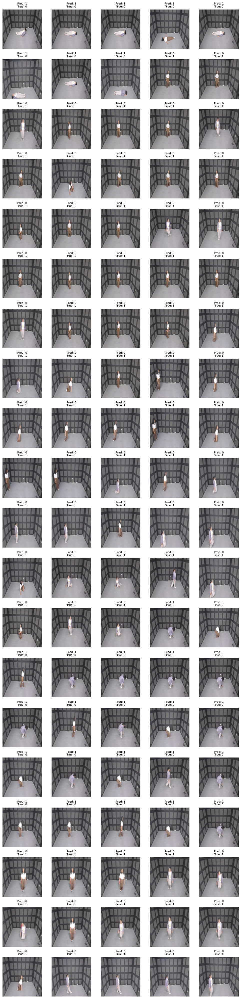

In [266]:
import math
import pandas as pd

predicted_csv = output_csv
ground_truth_csv = 'ground_truth_extracted.csv'
image_directory = 'test'


accuracy, correct, total, incorrect_predictions, y_true, y_pred = calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv)
print(f"Accuracy: {accuracy * 100:.2f}% ({correct}/{total} correct predictions)")


if incorrect_predictions:
    print(f"Visualizing {len(incorrect_predictions)} incorrect predictions...")
    visualize_incorrect_predictions(incorrect_predictions, image_directory)
else:
    print("No incorrect predictions to visualize.")

Accuracy: 94.80% (2040/2152 correct predictions)


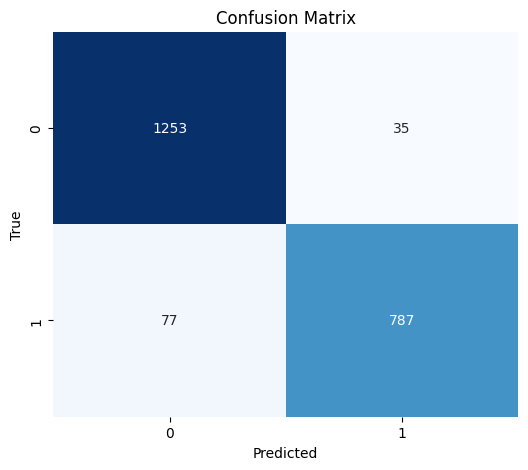

In [267]:
# Example usage
predicted_csv = output_csv  # Replace with your predicted CSV path
ground_truth_csv = 'ground_truth_extracted.csv'  # Replace with your ground truth CSV path

# Get accuracy and incorrect predictions
accuracy, correct, total, incorrect_predictions, y_true, y_pred = calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv)

# Print accuracy
print(f"Accuracy: {accuracy * 100:.2f}% ({correct}/{total} correct predictions)")

labels = [0, 1]  # Change if you have more classes
plot_confusion_matrix(y_true, y_pred, labels)


In [140]:
# # Example usage
# predicted_csv = '/kaggle/working/test_predictions.csv'  # Replace with your predicted CSV path
# ground_truth_csv = '/kaggle/input/label-diri/file_labels (3).csv'  # Replace with your ground truth CSV path

# # Get accuracy and incorrect predictions
# accuracy, correct, total, incorrect_predictions, y_true, y_pred = calculate_accuracy_and_log_incorrect(predicted_csv, ground_truth_csv)

# # Print accuracy
# print(f"Accuracy: {accuracy * 100:.2f}% ({correct}/{total} correct predictions)")

# # Plot the confusion matrix
# labels = [0, 1]  # Change if you have more classes
# plot_confusion_matrix(y_true, y_pred, labels)
